In [6]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from numpy.lib.histograms import histogram
from numpy import size
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import mean_absolute_error
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from matplotlib.gridspec import GridSpec

# Gather data

In [7]:
#Importing datasets
listingsDf = pd.read_csv("../Project1/listingsBoston.csv")
#Loading the dataset again for question 2 purposes
listingsDf2 = pd.read_csv('C:/Users/Petar/Desktop/DataScience/Udacity/Project1/listingsBoston.csv')

#### Assess

Firstly, we take a look at the shape of the dataset. Then we want to know if there are any columns that are entirely empty and finally we want to see the percentage of missing values per column

In [8]:
print("Shape of listings Boston:", listingsDf.shape)
print("Columns in 'listingsDf'with only missing values:", set(listingsDf.columns[listingsDf.isnull().mean() == 1]))
#Check the percentage of missing values by columns in the dataset
print('\nListings:\n', listingsDf.isnull().sum().sort_values(ascending=False)[:15] / listingsDf.shape[0])

Shape of listings Boston: (3585, 95)
Columns in 'listingsDf'with only missing values: {'jurisdiction_names', 'license', 'neighbourhood_group_cleansed', 'has_availability'}

Listings:
 has_availability                1.000000
license                         1.000000
neighbourhood_group_cleansed    1.000000
jurisdiction_names              1.000000
square_feet                     0.984379
monthly_price                   0.752301
weekly_price                    0.751185
security_deposit                0.625662
notes                           0.550907
interaction                     0.433473
access                          0.415342
neighborhood_overview           0.394700
host_about                      0.365132
transit                         0.359833
house_rules                     0.332497
dtype: float64


It can be seen that columns like square feet are almost entirely made up from missing values. Other columns like monthly and weekly price also have higher than 50% missing values. We need to find a way to populate the missing values.

Drop the columns which are entirely null because they will have no impact on our analysis. Then describe the dataset

In [9]:
#Dropping value with only null values
listingsDf = listingsDf.drop(['license', 'neighbourhood_group_cleansed', 'jurisdiction_names', 'has_availability'], axis=1)

#describe the dataset
listingsDf.describe()

,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,...,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,reviews_per_month
count,3.585000e+03,3.585000e+03,3.585000e+03,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3571.000000,3575.000000,...,3585.000000,2772.000000,2762.000000,2767.000000,2765.000000,2767.000000,2763.000000,2764.000000,3585.000000,2829.000000
mean,8.440875e+06,2.016091e+13,2.492311e+07,58.902371,58.902371,42.340032,-71.084818,3.041283,1.221647,1.255944,...,19.044630,91.916667,9.431571,9.258041,9.646293,9.646549,9.414043,9.168234,12.733891,1.970908
std,4.500787e+06,0.000000e+00,2.292781e+07,171.119663,171.119663,0.024403,0.031565,1.778929,0.501487,0.753060,...,35.571658,9.531686,0.931863,1.168977,0.762753,0.735507,0.903436,1.011116,29.415076,2.120561
min,3.353000e+03,2.016091e+13,4.240000e+03,0.000000,0.000000,42.235942,-71.171789,1.000000,0.000000,0.000000,...,0.000000,20.000000,2.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.010000
25%,4.679319e+06,2.016091e+13,6.103425e+06,1.000000,1.000000,42.329995,-71.105083,2.000000,1.000000,1.000000,...,1.000000,89.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,1.000000,0.480000
50%,8.577620e+06,2.016091e+13,1.928100e+07,2.000000,2.000000,42.345201,-71.078429,2.000000,1.000000,1.000000,...,5.000000,94.000000,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000,2.000000,1.170000
75%,1.278953e+07,2.016091e+13,3.622147e+07,7.000000,7.000000,42.354685,-71.062155,4.000000,1.000000,2.000000,...,21.000000,98.250000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,6.000000,2.720000
max,1.493346e+07,2.016091e+13,9.385411e+07,749.000000,749.000000,42.389982,-71.000100,16.000000,6.000000,5.000000,...,404.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,136.000000,19.150000


#### Clean

It is noticed that price variables are treated as strings as they begin with a dollar signs. They are converted into floats by removing the dollar sign and converting them to floats. 

Afterwards we plot histograms from the numerical values in the dataset to get an idea of the dataset

In [10]:
listingsDf['price'] = listingsDf['price'].str.replace('$', '').str.replace(',', '').astype(float);
listingsDf['cleaning_fee'] = listingsDf['cleaning_fee'].str.replace('$', '').str.replace(',', '').astype(float);
listingsDf['weekly_price'] = listingsDf['weekly_price'].str.replace('$', '').str.replace(',', '').astype(float);
listingsDf['monthly_price'] = listingsDf['monthly_price'].str.replace('$', '').str.replace(',', '').astype(float);
listingsDf['security_deposit'] = listingsDf['security_deposit'].str.replace('$', '').str.replace(',', '').astype(float);


C:\Users\Petar\AppData\Local\Temp\ipykernel_22536\223673637.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listingsDf['price'] = listingsDf['price'].str.replace('$', '').str.replace(',', '').astype(float);
C:\Users\Petar\AppData\Local\Temp\ipykernel_22536\223673637.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listingsDf['cleaning_fee'] = listingsDf['cleaning_fee'].str.replace('$', '').str.replace(',', '').astype(float);
C:\Users\Petar\AppData\Local\Temp\ipykernel_22536\223673637.py:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strin

It can be seen the two columns with highest missing values are *monthly_price* and *weekly_price*. As seen above they have a high correlation with the price so they cant be excluded.

Missing values in those columns will be populated with the respective neighbourhoods mean value . A more robust approach would include to train a regression model to predict the missing values.

In [11]:
listingsDf['weekly_price'] = listingsDf.groupby('neighbourhood_cleansed')['weekly_price'].transform(lambda x: x.fillna(x.mean()))
listingsDf['monthly_price'] = listingsDf.groupby('neighbourhood_cleansed')['weekly_price'].transform(lambda x: x.fillna(x.mean()))

#### Visualize

Describing the dataset via histograms

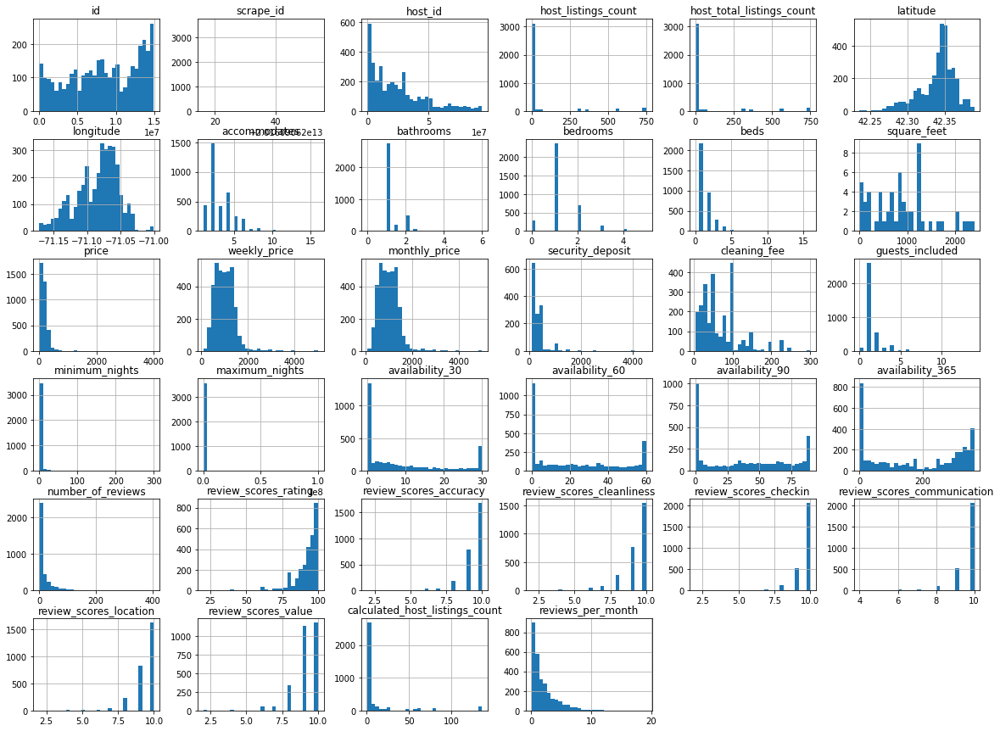

In [12]:
listingsDf.hist(figsize=[20,15], bins=30);

Looking at the histograms above it can be seen taht reviews are mostly positive. Secondly in terms of prices, listings seem to be skewed towards the cheaper end whilst square feet and services such as cleaning fee seem to be more widely distributed

A histogram will be plotted for the values in the *price* column to get a closer look at the price distribution

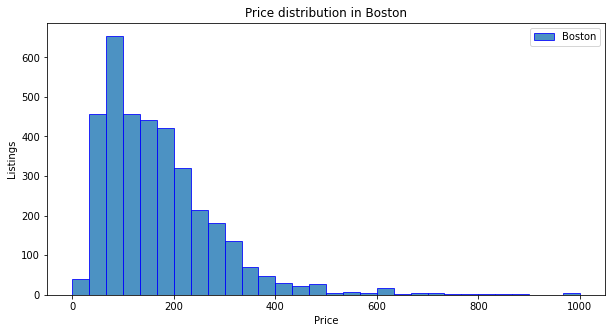

In [13]:
#Plotting all values
plt.figure(figsize=(10,5))

boston_price = listingsDf['price'].values.tolist()

plt.hist(boston_price, label='Boston', alpha=.8, edgecolor='blue', bins=30, range=(0,1000))
plt.xlabel("Price")
plt.ylabel("Listings")
plt.title("Price distribution in Boston")
plt.legend()

plt.show()

Looking at the above visualization it can be seen that there are a few listings on the top end of the spectrum. Those will be removed to avoid skewing data and producing less accurate results

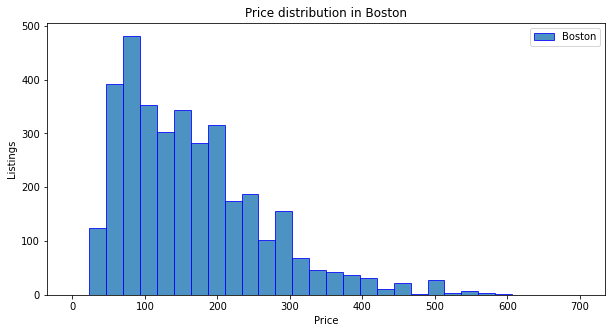

In [14]:
#Removing outliers from the dataset
plt.figure(figsize=(10,5))

listingsDf = listingsDf[listingsDf.price < 600]
listingsDf = listingsDf[listingsDf.price > 30]

price_list_edited = listingsDf['price'].values.tolist()

plt.hist(price_list_edited, label='Boston', alpha=.8, edgecolor='blue', bins=30, range=(0,700))
plt.xlabel("Price")
plt.ylabel("Listings")
plt.title("Price distribution in Boston")
plt.legend()

plt.show()

It can be seen from the above chart that the most dense price range is between 50 and 250 dollars

Now we will look into the average prices between different neighbourhoods. That will be done by plotting a bar chart which takes into account the **mean** from the **price** column

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


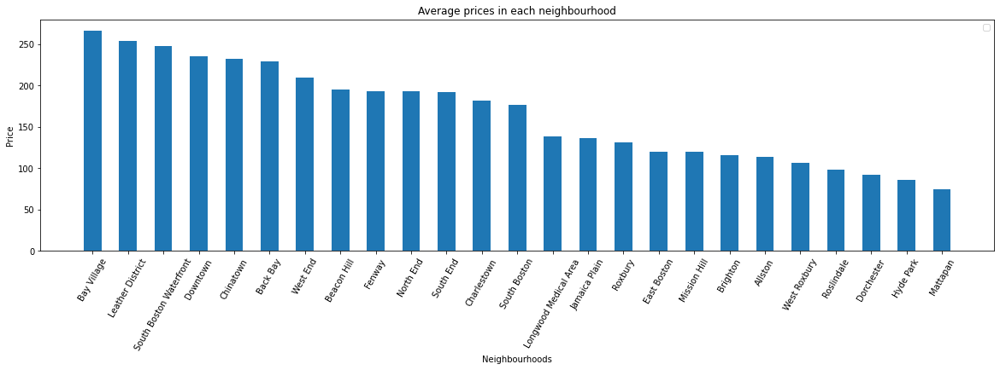

In [15]:
plt.figure(figsize=(20,5))
neighbourhood_mean = listingsDf.groupby(['neighbourhood_cleansed']).mean()['price'].sort_values(ascending=False)
X = neighbourhood_mean.keys().tolist()
X_axis = np.arange(len(X))

plt.bar(X_axis, neighbourhood_mean, 0.5)


plt.xticks(X_axis, X, rotation=60)
plt.xlabel("Neighbourhoods")
plt.ylabel("Price")
plt.title("Average prices in each neighbourhood")
plt.legend()
plt.show()

It looks like the average prices range from $260 to $80 where **Bay Village** has the highest average price at around $260 and **Mattapan** has the lowest at around the price of $80

# Q1 - Which factors influience the price of houses the most in Boston

#### Clean

Apart from the data that is already present, the dataset will be analyzed if it contains key words specified in adj_list. A boolean column will be created indicating with a 1 if the adjective has been used in the respective listing and 0 if it hasnt. Only columns specified in desc_col_list will be analyzed for key words 

In [16]:
#Selected adjectives to be included in the analysis
adj_lst = ['accessible', 'beautiful', 'best', 'better', 'brilliant', 'charming', 'cheap', 'cheerful', 'clean', 'comfortable', 'comfy',
            'connected', 'cosy', 'cozy', 'deluxe', 'desirable', 'elegant', 'excellent', 'favourite', 'fine', 'good', 'gorgeous', 'intimate',
            'large', 'nice', 'pretty', 'private', 'spacious', 'splendid', 'stylish', 'tidy', 'magnificent', 'delicious', 'decent', 'perfect',
            'positive', 'reasonable', 'tremendous', 'bright', 'modern', 'quiet' , 'multicultural', 'public transportation', 'easy access', 
            'shops', 'restaurants', 'welcoming', 'stores', 'shop', 'store', 'gem', 'cafes', 'transport', 'museum', 'family', 'bars', 'roommate',
            'pet', 'dog', 'cat', 'children', 'child', 'crazy', 'toddler', 'kid', 'parking', 'rail station', 'bus station', 'private bathroom',
            'kitchen', 'wifi', 'home office', 'professional', 'busy', 'chat', 'large', 'sunny']

#Selecting columns from which to extract those adjectives
desc_col_list = ["name", "summary", "space", "description", "neighborhood_overview", "notes", "transit", "interaction"]

A method *extract_key_words* to extract all the key words specified in the list 'adj_list' by combining all the text from the colums that are specified in 'col_list' Then separating the text into individual strings and checking for matching words. 

Highlighting cell of respective key word as 1 if the word exists in the text and as 0 if it doesnt. Returns a dataframe with the key word columns

In [17]:
def extract_key_words(df, col_list, adj_list):
    '''
    A method to extract all the key words specified in the list 'adj_list'
    by combining all the text from the colums that are specified in 'col_list'
    Then separating the text into individual strings and checking for matching
    words. Highlighting cell of respective key word as 1 if the word exists in the text
    and as 0 if it doesnt

    Args:
    df - Dataframe
    col_list - list of columns whose text to be combined
    adj_list - list of key words
    '''
    df["combinedString"] = ""
    #combining all columns together into one string
    for col in col_list:
        df["combinedString"] = df["combinedString"] + df[col].astype(str)
    
    #Checking for matches
    for adj in adj_list:
        df[adj] = 0
        for i in range(df.shape[0]):
            comb_str = df[['combinedString']].iloc[i]
            #replacing all the symbols in the string and making all the letters with lower case
            comb_str_lc = str(list(map(lambda x: x.lower(), comb_str))).replace(',', '').replace('"', '').replace('.', '').replace(':', '').replace('&', '').replace('-', '').replace('!', '').replace('(', '').replace(')', '')
            if adj in comb_str_lc:
                listingsDf[adj].iloc[i] = 1

extract_key_words(listingsDf, desc_col_list, adj_lst)


C:\Users\Petar\AppData\Local\Temp\ipykernel_22536\2447324201.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Petar\AppData\Local\Temp\ipykernel_22536\2447324201.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Petar\AppData\Local\Temp\ipykernel_22536\2447324201.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  listingsDf[adj].iloc[i] = 1
C:\Users\Peta

The next decision to be made is which categorical variables to include in the dataset. Upon inspection it has been concluded that *room type*, *bed type*, *property type* and *neighbourhood* will be influential in determining the price of a listing. 

Other columns were included to add a feeling of the host and will experiment if that has an influence on the price.

In [18]:
dummy_col = ['bed_type', 'room_type', 'property_type', 'host_response_time','bedrooms', "cancellation_policy", "instant_bookable", "neighbourhood_cleansed",
                "require_guest_profile_picture", "host_has_profile_pic", "host_identity_verified"]

for col in  dummy_col:
        #for each cat add dummy var, drop original column
        listingsDf = pd.concat([listingsDf.drop(col, axis=1), pd.get_dummies(listingsDf[col], prefix=col, prefix_sep='_', drop_first=True)], axis=1)

Creating a column list out of only numerical variables to include in the cleansed dataset

In [19]:
keep_col_list = []
keep_col_list = keep_col_list + listingsDf.select_dtypes(exclude='object').columns.tolist()

Certain columns containing numerical values have been dropped. The columns are as follows:
* scrape_id, host_id: has no effect on the price, variables used as unique keys in the database
* host_listings_count, host_total_listings_count, reviews_per_month, minimum_nights, maximum_nights, number_of_reviews, calculated_host_listings_count: columns are determined to have very little effect on the price
* square_feet: the column has 98% of inputs missing, hence it was determined that it will not provide any valuable insight 

In [20]:
#Create a new dataframe only with kept columns
listings_cleaned = listingsDf[keep_col_list]

#Further remove columns which will not be included in the analysis
listings_cleaned = listings_cleaned.drop(['scrape_id', 'host_id',"host_listings_count", "host_total_listings_count", 
                                "square_feet","reviews_per_month", "minimum_nights", "maximum_nights", 
                                "number_of_reviews",
                                "calculated_host_listings_count"], axis=1)
                                							

#### Visualize

Creating a bar chart which visualizes the Top 30 positive and Top 30 negative correlated factors with respect to price. The data is used from the newly formed dataframe consisting of the added key words columns

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


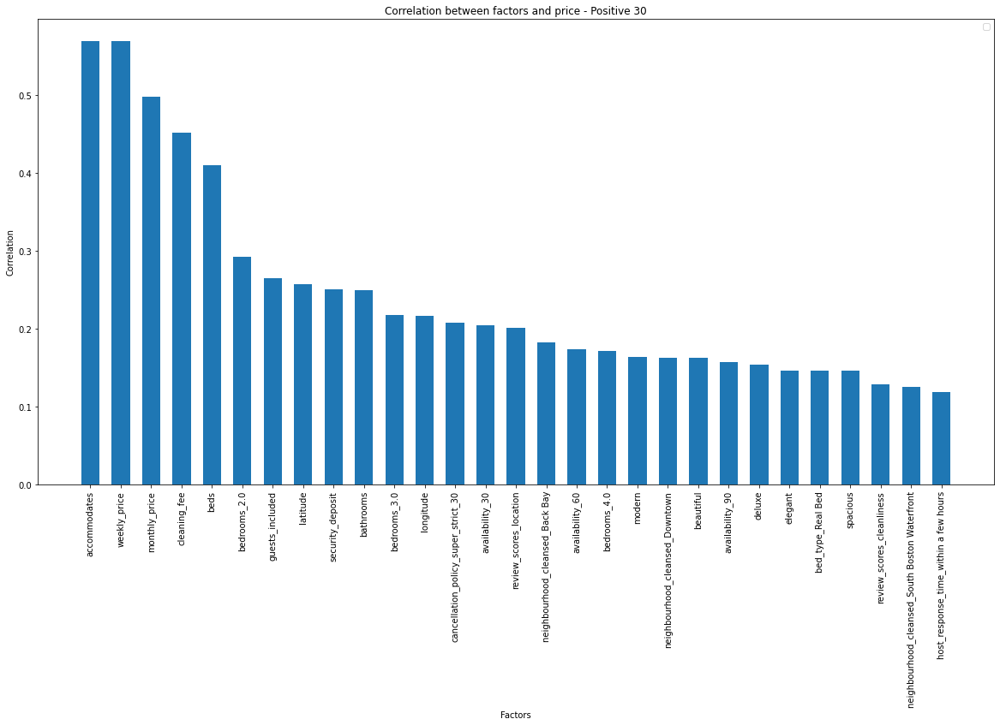

In [21]:
most_infl_s = listings_cleaned.corr()['price'].sort_values(ascending = False)[1:]

plt.figure(figsize=(20,10))

X = most_infl_s[:30].keys().tolist()
X_axis = np.arange(29)
plt.bar(X_axis, most_infl_s[1:30], 0.6)

plt.xticks(X_axis[:30], X[:29], rotation=90)
plt.xlabel("Factors")
plt.ylabel("Correlation")
plt.title("Correlation between factors and price - Positive 30")
plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


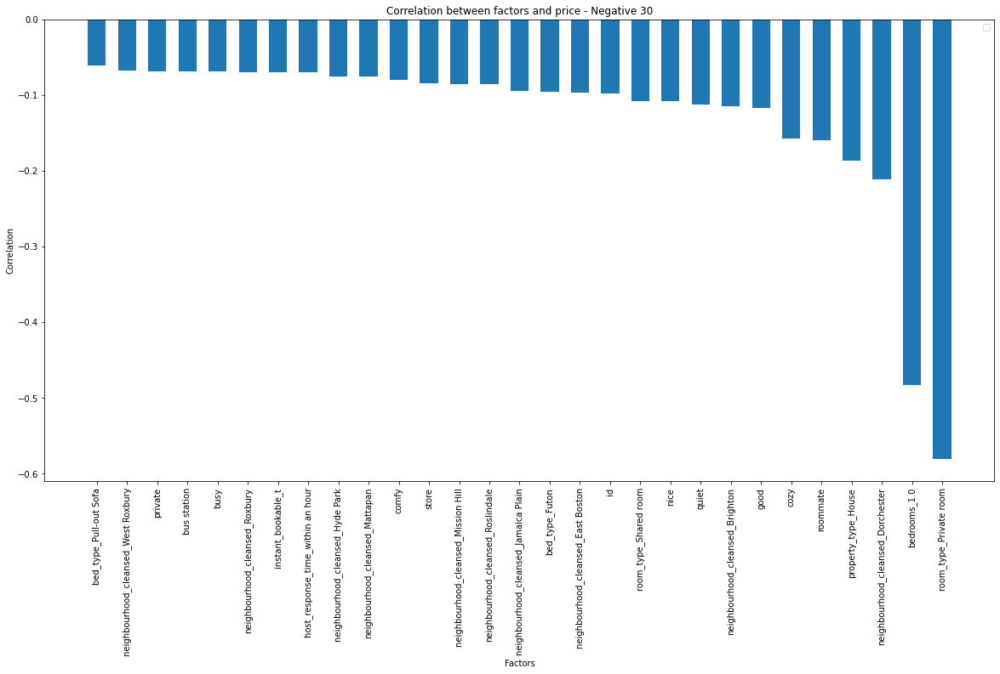

In [22]:
plt.figure(figsize=(20,10))

X = most_infl_s[-30:].keys().tolist()
X_axis = np.arange(29)
plt.bar(X_axis, most_infl_s[-29:], 0.6)

plt.xticks(X_axis, X[-29:], rotation=90)
plt.xlabel("Factors")
plt.ylabel("Correlation")
plt.title("Correlation between factors and price - Negative 30")
plt.legend()
plt.show()

The highest correlation between the set price is the weekly and monthly price of the accommodation, followed by the number of accommodates it can take. 

It can be seen that private rooms and 1 beds have the highest inverse correlation with price. It is also worth noting that modern, elegant and deluxe are the ones from the key words that are highly correlated to the price.

# Q2 - Find if there are differences in words which might reflect the difference in price between neighbourhoods


#### Visualize

Creating a word cloud to visualize the most used words in the respective neighbourhoods:

This will be done via a method nhood_sentiment which takes a dataframe as an input. Then groups the dataset into neighbourhoods and analyzes the content in the colum *neighbourhood_overview*. 

The result is a word cloud where the bigger in size a word is - the more it is used to describe the neighbourhood.

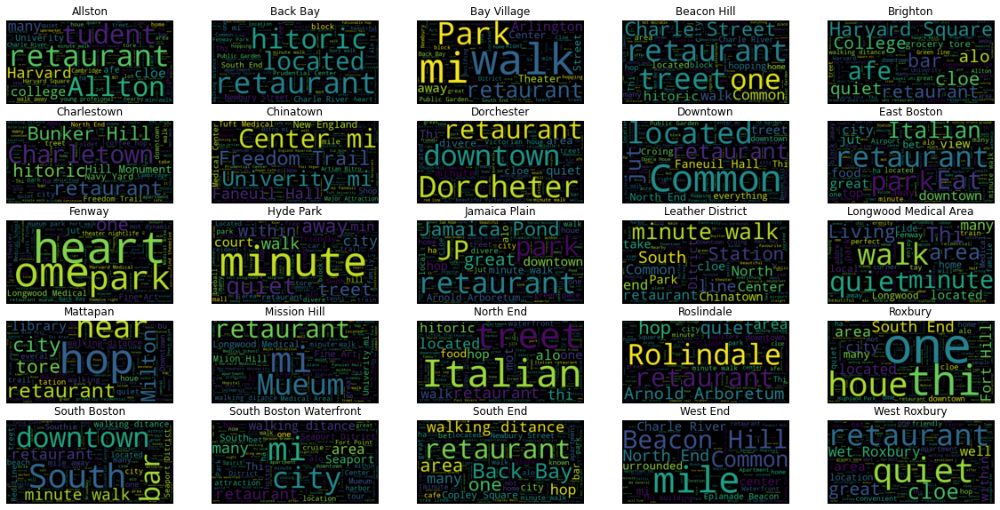

In [23]:
def nhood_sentiment(df):
    '''
    A method to create visualizations with the most commonly used words in 'neighborhood_overview' column

    Args:
    df - the dataframe to be used for analyzing

    Output:
    A grid containing the visualization of the most common words used per neighborhood
    '''

    #Drop all the NaN values
    neighbourhood_group = df.dropna(subset=['neighborhood_overview'], axis=0)
    #Group the dataset into neighborhoods
    groups_df = list(neighbourhood_group.groupby('neighbourhood_cleansed'))

    # Create stopword list:
    stopwords = set(STOPWORDS)
    stopwords.update(["br", "href"])

    #Creating the visualization grid
    fig = plt.figure(figsize=(20, 10))
    gs = GridSpec(nrows=5, ncols=5)

    #Counters for the grid
    n = 0
    m = 0
    

    for i in range(len(groups_df)):
        #Creating a string out of all rows for the respective group
        text = " ".join(overview for overview in groups_df[i][1]['neighborhood_overview'])
        #Filtering out the city name and other words
        text_edited = text.replace('Boston', '').replace('neighborhood', '').replace('s', '').replace(str(groups_df[i][0]), '')
        wordcloud = WordCloud(stopwords=stopwords).generate(text_edited)
        ax = fig.add_subplot(gs[n,m])
        plt.title(str(groups_df[i][0]))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        m+=1
        if m > 4:
            n += 1
            m = 0
        
    plt.show()

nhood_sentiment(listingsDf2)

Looking at figure 5, Bay Village seems to have a lot of mentions about a park, theater, restaurant. It can be suggested that the higher average prices are driven by a calmer area. 

Alternatively, Leather District, the second highest average prices neighbourhood, has words like minute walk, station, center etc. which suggests it is a very communicative place.

# Q3 - Find the best and worst listed deals

#### Clean

Listing the % of NaN values in the cleaned dataframe by dividing the sum of NaNs by the total rows

In [24]:
#List columns with NaN values
listings_cleaned.isnull().sum().sort_values(ascending=False)[:15] / listingsDf.shape[0]

security_deposit                 0.625926
cleaning_fee                     0.305698
review_scores_accuracy           0.225641
review_scores_location           0.225356
review_scores_value              0.225071
review_scores_checkin            0.224786
review_scores_cleanliness        0.224217
review_scores_communication      0.224217
review_scores_rating             0.222792
bathrooms                        0.003989
beds                             0.002564
id                               0.000000
property_type_Camper/RV          0.000000
property_type_Boat               0.000000
property_type_Bed & Breakfast    0.000000
dtype: float64

Columns *security_deposit* and *cleaning_fee* have a high percentage of missing values too. A decision has been made to treat those two columns as boolean values of whether the service is present or not, instead of populating with a mean value. That is considered to provide better predictive results.

The rest of the columns are populated with the mean values of the respective colum. *bathrooms* and *beds* do not have a high percentage of missing values, hence it is not expected for the means of populating them to have an affect on the predictive power

In [25]:
bool_cols = ["cleaning_fee", "security_deposit"]

def populateNA(df,bool_cols):
    '''
    A method to populate the NaN values in a dataframe. Boolean columns will consist of 
    1 if there is a value and a 0 if there is an NaN. All other columns' NaNs' to be populated
    with the mean of its respective column

    Args:
    df - dataframe
    bool_cols - columns to be transformed to boolean values

    Return:
    df_no_na - a dataframe with no NaN values
    '''
    df[bool_cols] = df[bool_cols].where(df[bool_cols].isnull(), 1).fillna(0).astype(int)
    #All other NaN values to be populated with the column mean
    df_no_na = df
    df_no_na.fillna(df_no_na.mean(), inplace=True)

    return(df_no_na)

listings_no_nan = populateNA(listings_cleaned, bool_cols)


#### Model

A Linear Regression model which splits the dataset into a training and testing dataset at 70/30 % respectively. 

The column that is ought to be predicted is *price*

After the model is trained, predicted values have been scored against actual values and an r2 score has been generated

In [26]:
#Split into explanatory and response variables
X = listings_no_nan.drop(['price'], axis=1)
y = listings_no_nan['price']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=42)

lm_model = LinearRegression(normalize=True) # Instantiate
lm_model.fit(X_train, y_train) #Fit

#Predict using your model
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)

#Score using your model
test_score = r2_score(y_test, y_test_preds)
train_score = r2_score(y_train, y_train_preds)

print('The test score is: ', '{:.3f}'.format(test_score))
print('The train score is: ', '{:.3f}'.format(train_score))

The test score is:  0.653
The train score is:  0.686


c:\Programs\Python\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(


The philosophy behind this idea is that the price a landlord puts on his accommodation does not always correspond to the market in that area. 

Landlord can have a vague idea of the market but will always have some bias towards their accommodation, swaying the price one way or another.

After training the model a result of 0.65% has been achieved with a mean absolute error of 40%. 

Whilst the performance of the model can be considered low in some cases, in this case it is deemed satisfactory due to the context described earlier.

The model has been evaluated by using 2 visualizations. They take the predicted values by the linear model and compare them to the actual ones presented in the dataset

One is a line chart representing the actual (green) vs predicted(blue) distribution. 

The second one is a scatter plot which plots the values against the ideal line

c:\Programs\Python\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)


  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


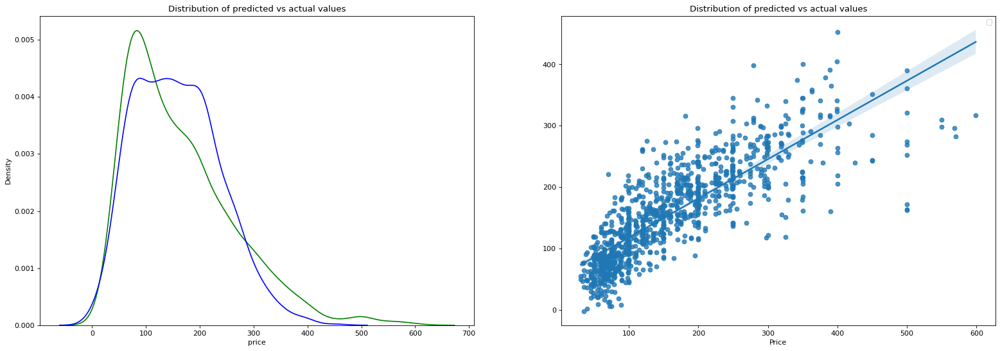

Mean absolute error of LinearRegression(normalize=True): 39.861551127617595


In [27]:
def evaluate_model(model, x_train, y_train, x_test, y_test, y_test_preds):

    '''
    A method to create visualizations on the performance of the Linear model

    Args:
    _model - LinearRegression model
    x_train - trained X
    y_train - trained Y
    x_test - test X
    y_test - test Y
    y_test_preds - predicted values for y based on the Linear model

    '''
    model.fit(x_train, y_train)
    _mean_abs_err = mean_absolute_error(y_test, y_test_preds)
    
    fig, axs = plt.subplots(1, 2, figsize=(24, 8), dpi=80)
    axs[0].set_title('Distribution of predicted vs actual values')
    ax1 = sns.kdeplot(data=y_test, label='Actual values', color="g", ax=axs[0])
    ax2 = sns.kdeplot(data=y_test_preds, label='Predicted values', color="b",  ax=ax1)
    plt.legend()

    sns.regplot(x=y_test, y=y_test_preds)
    plt.title('Distribution of predicted vs actual values')
    plt.xlabel('Price')
    plt.legend()
    plt.show()
    plt.close()
    
    print("Mean absolute error of {0}: {1}".format(model, _mean_abs_err))

# Create instance of Linear Regressor and evaluate the same
evaluate_model(lm_model, X_train, y_train, X_test, y_test, y_test_preds)

The actual price distribution (green line) vs the predicted price distribution (blue line) has been presented in the visualization on the lefthand side. It can be seen from this visualization that there are good deals to be grabbed in the $50–$150 region indicated by the green line being higher than the blue line. 

On the other hand, it can be seen that the pricier options have not been justified based on the algorithm.

#### Visualize

Two bar charts are going to be created, indicating the top 10 best and worst deals based on the linear model.

To do this, the predicted price column has been combined with the initial dataset.

Following that, a new column is created *price_diff* that contains the product of the following formula *predicted_price - actual_price*

The highest values are the best deals, whereas the lowest values are the worst deals, indicating that the actual price is far higher than the predicted one

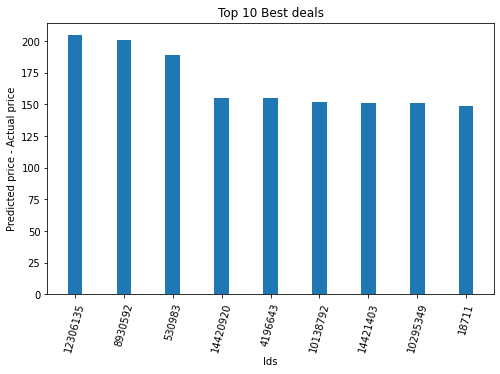

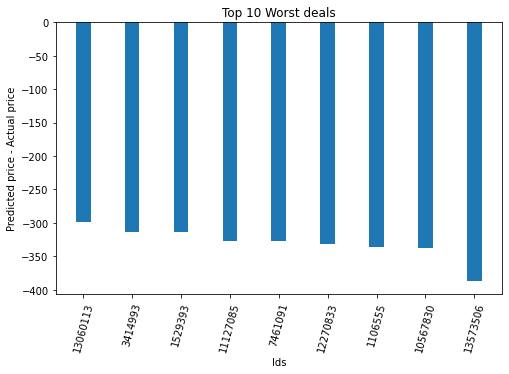

In [28]:
def generate_best_worst_deals(X_test,X_train,df):
    '''
    A method to calculate the price difference between the actual and the predicted value

    Args:
    X_test - the test dataframe from the linear model
    X_train - the train dataframe from the linear model
    df - the original dataframe

    Output:
    A plot to show the top 10 highest positive and negative deltas
    '''

    X_test['pred_price'] = lm_model.predict(X_test)
    X_train['pred_price'] = lm_model.predict(X_train)

    #Condensing it to only id and pred_price
    X_test_merge = X_test[['id', 'pred_price']]
    X_train_merge = X_train[['id', 'pred_price']]

    #Merging the two datasets to match the shape of the original
    X_merge = pd.concat([X_test_merge, X_train_merge], axis=0)

    #Add pred_price to original dataframe
    merged_listings = pd.merge(X_merge, df, on=['id'])
    
    #Create a column for the price difference
    merged_listings['price_diff'] = merged_listings['pred_price'] - merged_listings['price']

    sorted_df = merged_listings.sort_values(by=['price_diff'], ascending = False)

    plt.figure(1, figsize=(8,5))

    X = sorted_df['id'][:10].tolist()
    X_axis = np.arange(9)
    plt.bar(X_axis, sorted_df['price_diff'][:9].tolist(), 0.3)

    plt.xticks(X_axis[:10], X[:9], rotation=75)
    plt.xlabel("Ids")
    plt.ylabel("Predicted price - Actual price")
    plt.title("Top 10 Best deals")

    plt.figure(2, figsize=(8,5))

    X = sorted_df['id'][-10:].tolist()
    X_axis = np.arange(9)
    plt.bar(X_axis, sorted_df['price_diff'][-9:].tolist(), 0.3)

    plt.xticks(X_axis[-10:], X[-9:], rotation=75)
    plt.xlabel("Ids")
    plt.ylabel("Predicted price - Actual price")
    plt.title("Top 10 Worst deals")

    plt.show()

    
generate_best_worst_deals(X_test, X_train, listings_no_nan)

The bar charts above present the listing ids of the Top 10 best and worst deals. With the best deal being around $200 cheaper than predicted and the worst being $360 more expensive.